In [1]:
#Loading dataset
import pandas as pd
import sys
sys.path.append(r"C:\Users\Ericd\OneDrive\Desktop\wudimoxing")
from wudi_regression import Regression
from wudi_classification import Classification
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import numpy as np
from pickle import dump, load
import optuna
from colorama import Fore
from IPython.display import display

df = pd.read_excel('QAQ.xlsx')
df.to_csv('Wastewater treatment plant.csv', index=False)

``multivariate`` option is an experimental feature. The interface can change in the future.


In [2]:
file1_path = "Wastewater treatment plant.csv"
file2_path = "data_features_Class.csv"


df1 = pd.read_csv(file1_path)
df2 = pd.read_csv(file2_path)


# Concatenate the DataFrames horizontally (along columns)
combination = pd.concat([df1, df2], axis=1)

# Replace 'final.csv' with the desired name for the combined CSV file
combination.to_csv('CHANGE RATE(Class).csv', index=False)
df = pd.read_csv('CHANGE RATE(Class).csv')

In [3]:
df = df.sort_values(by='Latitude', ascending=True)

In [4]:
new_column_name = 'Aeration tank(HRT)'
df.rename(columns={'Aeration tank': new_column_name}, inplace=True)

new_column_name = 'Plant(HRT)'
df.rename(columns={'Plant': new_column_name}, inplace=True)

new_column_name = 'Annual average temperature (oC)'
df.rename(columns={'Annual average': new_column_name}, inplace=True)

new_column_name = 'Annual mean of daily maximum temperature (oC) '
df.rename(columns={'Annual mean of daily maximum': new_column_name}, inplace=True)

new_column_name = 'Annual mean of daily minimum temperature (oC) '
df.rename(columns={'Annual mean of daily minimum': new_column_name}, inplace=True)

new_column_name = 'Sampling month average temperature (oC)'
df.rename(columns={'Sampling month average': new_column_name}, inplace=True)

new_column_name = 'Annual mean of daily minimum temperature (oC) '
df.rename(columns={'Annual mean of daily minimum': new_column_name}, inplace=True)

new_column_name = 'Annual Precipitation(mm)'
df.rename(columns={'Annual': new_column_name}, inplace=True)

new_column_name = 'Sampling month Precipitation(mm)'
df.rename(columns={'Sampling month': new_column_name}, inplace=True)

new_column_name = 'Annual Precipitation(mm)'
df.rename(columns={'Annual': new_column_name}, inplace=True)

new_column_name = 'General AS process type'
df.rename(columns={'General type ': new_column_name}, inplace=True)

new_column_name = 'Detailed AS process type'
df.rename(columns={'Detailed type': new_column_name}, inplace=True)

new_column_name = 'Percentage of Industry wastewater source'
df.rename(columns={'Percentage': new_column_name}, inplace=True)

new_column_name = 'Contained in Inf? (Industry wastewater source)'
df.rename(columns={'Contained in Inf?': new_column_name}, inplace=True)

new_column_name = 'Others(Order)'
df.rename(columns={'Others.2': new_column_name}, inplace=True)

new_column_name = 'Others(Classs)'
df.rename(columns={'Others.1': new_column_name}, inplace=True)

new_column_name = 'Others(Phylum)'
df.rename(columns={'Others': new_column_name}, inplace=True)

new_column_name = 'Unclassified(Phylum)'
df.rename(columns={'Unclassified': new_column_name}, inplace=True)

new_column_name = 'Unclassified(Classs)'
df.rename(columns={'Unclassified.1': new_column_name}, inplace=True)

new_column_name = 'Unclassified(Order)'
df.rename(columns={'Unclassified.2': new_column_name}, inplace=True)



In [5]:
columns_to_drop = ['Sample ID', 'WWTP ID', 'SiteID', 'Site Name', 'Sampling Date',
        'Sampling moment','Actual Inf rate (m3/d)',
       'Nitrification', 'Denitrification','Aerator type', 'BOD (mg/l) inf/(1+recycle ratio)', 'BOD (mg/l) Aeration tank inf',
       'COD (mg/l) Inf/(1+recycle ratio)',
       'COD (mg/l) Aeration tank inf', 'F/M (kg BOD/kg MLSS-d)', 'NH4-N (mg/l) Aeration tank inf', 
        'TN (mg/l) Aeration tank inf','TP (mg/l) Aeration tank inf', 'Conductivity (μS/cm)','SRTd',
       'COD', 'NH4N', 'TP','NH4-N (mg/l)', 'NO3-N (mg/l)', 'SVI (ml/g)',
        'Sample ID.1' ,'Unnamed: 0','Sampling month average.1',
    'Sampling month.1']

df = df.drop(columns=columns_to_drop)

In [6]:
'''
#df['BOD(difference)'] = df['BOD (mg/l) Inf']- df['BOD (mg/l) Eff'] #regressor1
#df['COD(difference)'] = df['COD (mg/l) Inf']- df['COD (mg/l) Eff'] #regressor2
#df['NH4-N(difference)'] = df['NH4-N (mg/l) Inf']- df['NH4-N (mg/l) Eff'] #regressor3
#df['TN(difference)'] = df['TN (mg/l) Inf']- df['TN (mg/l) Eff'] #regressor4
#df['TP(difference)'] = df['TP (mg/l) Inf']- df['TP (mg/l) Eff'] #regressor5
'''
df['BOD(Percentage)'] = (df['BOD (mg/l) Inf']- df['BOD (mg/l) Eff'])/df['BOD (mg/l) Inf'] #regressor6
df['COD(Percentage)'] = (df['COD (mg/l) Inf']- df['COD (mg/l) Eff'])/df['COD (mg/l) Inf'] #regressor7
df['NH4-N(Percentage)'] = (df['NH4-N (mg/l) Inf']- df['NH4-N (mg/l) Eff'])/df['NH4-N (mg/l) Inf'] #regressor8
df['TN(Percentage)'] = (df['TN (mg/l) Inf']- df['TN (mg/l) Eff'])/df['TN (mg/l) Inf'] #regressor9
df['TP(Percentage)'] = (df['TP (mg/l) Inf']- df['TP (mg/l) Eff'])/df['TP (mg/l) Inf'] #regressor10


In [7]:
df.iloc

In [8]:
df.dropna(inplace=True)

In [9]:
df['Climate typea'] = df['Climate typea'].replace({'Cfa': 0, 'Dwa': 1,'Dfb': 2,'Dfa': 3,'Cwa': 4,'Csa':5,'Csb':6,'Cfb':7,'Aw':8,'Af':9,'Cfc':10,'Cwb':11,'Dsc':12,'BWh':13,'Cwc':14,'Am':15,'ET':16})

In [10]:
'''# Make a copy of the DataFrame to preserve the original 'df'
df_sorted = df.copy()

# Sort the DataFrame copy 'df_sorted' by the 'Latitude' column in ascending order
df_sorted.sort_values(by='Latitude', inplace=True)

# Use the 'rank' method to assign ranks based on the sorted 'Latitude'
df_sorted['City Name'] = df_sorted['Latitude'].rank().astype(int) - 1

# Update the 'City Name' column in the original DataFrame 'df' with the ranks
df['City Name'] = df_sorted['City Name']

print(df['City Name'])'''

"# Make a copy of the DataFrame to preserve the original 'df'\ndf_sorted = df.copy()\n\n# Sort the DataFrame copy 'df_sorted' by the 'Latitude' column in ascending order\ndf_sorted.sort_values(by='Latitude', inplace=True)\n\n# Use the 'rank' method to assign ranks based on the sorted 'Latitude'\ndf_sorted['City Name'] = df_sorted['Latitude'].rank().astype(int) - 1\n\n# Update the 'City Name' column in the original DataFrame 'df' with the ranks\ndf['City Name'] = df_sorted['City Name']\n\nprint(df['City Name'])"

In [11]:
unique_city_names = df['City Name'].unique()
unique_country_names = df['Country/Region'].unique()
unique_continent_names = df['Continent'].unique()

# Print the list of unique city names
print(unique_city_names)
print(unique_country_names)
print(unique_continent_names)

['Brisbane' 'Singapore' 'Sanya' 'Shenzhen' 'Xiamen' 'Chongqing' 'Chengdu'
 'Wuxi' 'Xian' 'Qingdao' 'Jinan' 'Dalian']
['Australia' 'Singapore' 'China']
['Australasia' 'Asia']


In [12]:
# Define the list of city names in the desired order
desired_city_order = [
    'Tasmania', 'Adelaide', 'Sydney', 'Cape Town', 'Santiago', 'Durban', 'Brisbane',
    'Pretoria', 'BRRP', 'Belo Horizonte', 'Cairns', 'Fortaleza', 'Singapore',
    'Cali', 'Sanya', 'Guadalajara', 'Honolulu', 'Shenzhen', 'South Taiwan',
    'Xiamen', 'Monterrey', 'Changsha', 'Chongqing', 'Houston', 'Wuhan', 'Chengdu',
    'Shanghai', 'USTF', 'Wuxi', 'USVD', 'USWR', 'Dallas', 'USOP', 'San Diego',
    'Phoenix', 'USAG', 'USAT', 'Los Angeles', 'Xian', 'Oklahoma City', 'USOK',
    'Fort Wayne', 'Raleigh', 'Qingdao', 'Johnson City', 'Kingsport', 'Jinan',
    'Virginia Beach', 'Seoul-Incheon', 'San Francisco', 'Dalian', 'Columbia MO',
    'USMD', 'Beijing', 'Hartford', 'Rome', 'Chicago', 'Ann Arbor', 'Guelph',
    'Bologna', 'Cowansville', 'Salaberry de Valleyfield', 'Farnham', 'Pincourt',
    'Vaudreuil Dorion', 'Granby', 'Sainte Catherine', 'Venice-Padova',
    'Marieville', 'Portland', 'Saint-Hyacinthe', 'Haerbin', 'Val-David',
    'Mont Tremblant', 'Buchs', 'USST', 'Bruck an der Leitha', 'Mayerling', 'DEHE',
    'DEKS', 'Newcastle upon Tyne', 'Falkenberg', 'Aalborg', 'Ullared', 'Varberg',
    'Vallby', 'Fairbanks'
]

desired_country_order = [
    'Australia', 'South Africa', 'Chile', 'Brazil', 'Singapore', 'Colombia',
    'China', 'Mexico', 'United States', 'Taiwan (ROC)', 'South Korea', 'Italy',
    'Canada', 'Switzerland', 'Austria', 'Germany', 'United Kindom', 'Sweden',
    'Denmark'
]

desired_continent_order = [
    'Australasia', 'Africa', 'South America', 'Asia', 'North America', 'Europe'
]

# Create a mapping function
def create_mapping(desired_order):
    return {item: idx for idx, item in enumerate(desired_order)}

# Create mappings for city names, country names, and continent names
city_id_mapping = create_mapping(desired_city_order)
country_id_mapping = create_mapping(desired_country_order)
continent_id_mapping = create_mapping(desired_continent_order)

# Replace the respective columns with corresponding ID values
df['City Name'] = df['City Name'].map(city_id_mapping)
df['Country/Region'] = df['Country/Region'].map(country_id_mapping)
df['Continent'] = df['Continent'].map(continent_id_mapping)

# Print the resulting DataFrames with IDs
print(df[['City Name']])
print(df[['Country/Region']])
print(df[['Continent']])

     City Name
301          6
300          6
299          6
250         12
248         12
..         ...
136         50
137         50
138         50
140         50
139         50

[77 rows x 1 columns]
     Country/Region
301               0
300               0
299               0
250               4
248               4
..              ...
136               6
137               6
138               6
140               6
139               6

[77 rows x 1 columns]
     Continent
301          0
300          0
299          0
250          3
248          3
..         ...
136          3
137          3
138          3
140          3
139          3

[77 rows x 1 columns]


In [13]:

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
encoded_cities = label_encoder.fit_transform(df['Detailed AS process type'])
df['Detailed AS process type'] = encoded_cities
print(df[['Detailed AS process type']])

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
encoded_cities = label_encoder.fit_transform(df['General AS process type'])
df['General AS process type'] = encoded_cities
print(df[['General AS process type']])

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
encoded_cities = label_encoder.fit_transform(df['Contained in Inf? (Industry wastewater source)'])
df['Contained in Inf? (Industry wastewater source)'] = encoded_cities
print(df[['Contained in Inf? (Industry wastewater source)']])




     Detailed AS process type
301                         2
300                         2
299                         2
250                         3
248                         3
..                        ...
136                         3
137                         3
138                         3
140                         3
139                         3

[77 rows x 1 columns]
     General AS process type
301                        1
300                        1
299                        1
250                        2
248                        2
..                       ...
136                        2
137                        2
138                        2
140                        2
139                        2

[77 rows x 1 columns]
     Contained in Inf? (Industry wastewater source)
301                                               1
300                                               1
299                                               1
250                                   

In [14]:
data_types = df.dtypes

In [15]:
# Filter the columns that have the data type 'object'
object_columns = data_types[data_types == 'object'].index

# Display the list of columns with object data type
print("Columns with object data type:")
print(object_columns)

Columns with object data type:
Index([], dtype='object')


In [16]:
features_bodp = df.drop(['BOD (mg/l) Inf', 'BOD (mg/l) Eff', 'BOD(Percentage)',
       'COD(Percentage)', 'NH4-N(Percentage)', 'TN(Percentage)',
       'TP(Percentage)'], axis = 1)
labels_bodp = df['BOD(Percentage)']

features_codp = df.drop([ 'BOD(Percentage)',
       'COD(Percentage)', 'NH4-N(Percentage)', 'TN(Percentage)',
       'TP(Percentage)','COD (mg/l) Inf', 'COD (mg/l) Eff'], axis = 1)
labels_codp = df['COD(Percentage)']

features_nh4np = df.drop(['BOD(Percentage)',
       'COD(Percentage)', 'NH4-N(Percentage)', 'TN(Percentage)',
       'TP(Percentage)','NH4-N (mg/l) Inf', 'NH4-N (mg/l) Eff'], axis = 1)
labels_nh4np = df['NH4-N(Percentage)']

features_tnp = df.drop([  'BOD(Percentage)',
       'COD(Percentage)', 'NH4-N(Percentage)', 'TN(Percentage)',
       'TP(Percentage)','TN (mg/l) Inf',
       'TN (mg/l) Eff'], axis = 1)
labels_tnp = df['TN(Percentage)']

features_tpp = df.drop([ 'BOD(Percentage)',
       'COD(Percentage)', 'NH4-N(Percentage)', 'TN(Percentage)',
       'TP(Percentage)','TP (mg/l) Inf', 'TP (mg/l) Eff'], axis = 1)
labels_tpp = df['TP(Percentage)']


In [17]:
remaining_features = features_bodp.columns.tolist()

In [18]:
regressor6 = Regression(
    predictor=['all'], 
    exclude_models = ['ann', 'krr']
)
regressor6.fit(features_bodp, labels_bodp)


          
██████         ███     ██        ██ ████ ██████                ██████ █████   ████ ██████
██        ██ ██      ██  ██      ██    ██   ██        ██            ██         ██      █   ██   ██        
██        ██ ███████   ██    ██     ██   ██        ██  ████  ██████ █████     ██   ██        
██        ██ ██      ██    ██  ██      ██   ██        ██            ██         ██  █       ██   ██        
██████     ██      ██      ███      ████ ██████                ██████ ██    ██ ████ ██████

 

Start [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training [*]

Training Done [ ✓ ]

Results Below



,Name,R2 Score,Mean Absolute Error,Root Mean Squared Error,KFold Accuracy,Model
0,Linear Regression,75.383197,0.011967,0.027525,77.838440,LinearRegression()
1,Stochastic Gradient Descent Regressor,-0.905535,0.049977,0.055727,-170290.182211,SGDRegressor()
2,Elastic Net Regressor,-3.872621,0.033578,0.056540,-24.911660,ElasticNet()
3,Bayesian Ridge Regressor,94.474016,0.006799,0.013041,80.743789,BayesianRidge()
4,Support Vector Regressor,-67.011033,0.068746,0.071694,-558.847709,SVR()
5,K-Neighbors Regressor,74.831576,0.019831,0.027831,7.927223,KNeighborsRegressor()
6,Decision Trees Regressor,82.011024,0.005882,0.023529,70.181843,DecisionTreeRegressor()
7,Random Forest Regressor,81.694364,0.013607,0.023736,61.009975,"(DecisionTreeRegressor(max_features='auto', ra..."
8,Gradient Boost Regressor,79.290639,0.009605,0.025246,80.390067,([DecisionTreeRegressor(criterion='friedman_ms...
9,AdaBoost Regressor,77.636909,0.010833,0.026235,82.566576,"(DecisionTreeRegressor(max_depth=3, random_sta..."



Completed Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/regression/models/Extra_Trees_Regressor_1691797957.pkl and its scaler to lucifer_ml_info/best/regression/scalers/Extra_Trees_Regressor_Scaler_1691797957.pkl 

Time Elapsed :  16.74 seconds 



In [19]:
regressor7 = Regression(
    predictor=['all'], 
    exclude_models = ['ann', 'krr']
)
regressor7.fit(features_codp, labels_codp)


          
██████         ███     ██        ██ ████ ██████                ██████ █████   ████ ██████
██        ██ ██      ██  ██      ██    ██   ██        ██            ██         ██      █   ██   ██        
██        ██ ███████   ██    ██     ██   ██        ██  ████  ██████ █████     ██   ██        
██        ██ ██      ██    ██  ██      ██   ██        ██            ██         ██  █       ██   ██        
██████     ██      ██      ███      ████ ██████                ██████ ██    ██ ████ ██████

 

Start [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training [*]

Training Done [ ✓ ]

Results Below



,Name,R2 Score,Mean Absolute Error,Root Mean Squared Error,KFold Accuracy,Model
0,Linear Regression,50.136012,0.015803,0.031575,21.396415,LinearRegression()
1,Stochastic Gradient Descent Regressor,-18.285056,0.045656,0.048631,-105052.540114,SGDRegressor()
2,Elastic Net Regressor,-0.742723,0.034359,0.044881,-20.361656,ElasticNet()
3,Bayesian Ridge Regressor,96.903707,0.005627,0.007868,60.601866,BayesianRidge()
4,Support Vector Regressor,-29.175526,0.045291,0.050821,-112.426356,SVR()
5,K-Neighbors Regressor,75.757528,0.015088,0.022016,36.818203,KNeighborsRegressor()
6,Decision Trees Regressor,73.606584,0.009441,0.022972,29.550490,DecisionTreeRegressor()
7,Random Forest Regressor,80.084850,0.011108,0.019955,56.405211,"(DecisionTreeRegressor(max_features='auto', ra..."
8,Gradient Boost Regressor,95.017865,0.004997,0.009981,70.561922,([DecisionTreeRegressor(criterion='friedman_ms...
9,AdaBoost Regressor,74.937049,0.009768,0.022386,72.644053,"(DecisionTreeRegressor(max_depth=3, random_sta..."



Completed Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/regression/models/Catboost_Regressor_1691797974.pkl and its scaler to lucifer_ml_info/best/regression/scalers/Catboost_Regressor_Scaler_1691797974.pkl 

Time Elapsed :  16.93 seconds 



In [20]:
regressor8 = Regression(
    predictor=['all'], 
    exclude_models = ['ann', 'krr']
)
regressor8.fit(features_nh4np, labels_nh4np)


          
██████         ███     ██        ██ ████ ██████                ██████ █████   ████ ██████
██        ██ ██      ██  ██      ██    ██   ██        ██            ██         ██      █   ██   ██        
██        ██ ███████   ██    ██     ██   ██        ██  ████  ██████ █████     ██   ██        
██        ██ ██      ██    ██  ██      ██   ██        ██            ██         ██  █       ██   ██        
██████     ██      ██      ███      ████ ██████                ██████ ██    ██ ████ ██████

 

Start [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training [*]

Training Done [ ✓ ]

Results Below



,Name,R2 Score,Mean Absolute Error,Root Mean Squared Error,KFold Accuracy,Model
0,Linear Regression,96.874810,0.006109,0.007693,-12.906983,LinearRegression()
1,Stochastic Gradient Descent Regressor,-7.207022,0.041152,0.045060,-142561.012569,SGDRegressor()
2,Elastic Net Regressor,-6.365488,0.038435,0.044883,-47.386071,ElasticNet()
3,Bayesian Ridge Regressor,97.963629,0.004465,0.006210,31.557546,BayesianRidge()
4,Support Vector Regressor,-3.293476,0.039889,0.044230,-120.537064,SVR()
5,K-Neighbors Regressor,46.435537,0.025264,0.031850,-63.002967,KNeighborsRegressor()
6,Decision Trees Regressor,91.279805,0.005280,0.012851,32.573701,DecisionTreeRegressor()
7,Random Forest Regressor,89.867403,0.010520,0.013853,53.583147,"(DecisionTreeRegressor(max_features='auto', ra..."
8,Gradient Boost Regressor,92.495223,0.006531,0.011922,73.454867,([DecisionTreeRegressor(criterion='friedman_ms...
9,AdaBoost Regressor,98.182965,0.003660,0.005866,87.215323,"(DecisionTreeRegressor(max_depth=3, random_sta..."



Completed Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/regression/models/Extra_Trees_Regressor_1691797991.pkl and its scaler to lucifer_ml_info/best/regression/scalers/Extra_Trees_Regressor_Scaler_1691797991.pkl 

Time Elapsed :  17.52 seconds 



In [21]:
regressor9 = Regression(
    predictor=['all'], 
    exclude_models = ['ann', 'krr']
)
regressor9.fit(features_tnp, labels_tnp)


          
██████         ███     ██        ██ ████ ██████                ██████ █████   ████ ██████
██        ██ ██      ██  ██      ██    ██   ██        ██            ██         ██      █   ██   ██        
██        ██ ███████   ██    ██     ██   ██        ██  ████  ██████ █████     ██   ██        
██        ██ ██      ██    ██  ██      ██   ██        ██            ██         ██  █       ██   ██        
██████     ██      ██      ███      ████ ██████                ██████ ██    ██ ████ ██████

 

Start [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training [*]

Training Done [ ✓ ]

Results Below



,Name,R2 Score,Mean Absolute Error,Root Mean Squared Error,KFold Accuracy,Model
0,Linear Regression,83.296266,0.018533,0.040544,93.762978,LinearRegression()
1,Stochastic Gradient Descent Regressor,31.621904,0.064292,0.082030,-3938.264645,SGDRegressor()
2,Elastic Net Regressor,-11.883696,0.081239,0.104930,-32.492587,ElasticNet()
3,Bayesian Ridge Regressor,92.502925,0.016348,0.027162,95.839608,BayesianRidge()
4,Support Vector Regressor,27.037631,0.071672,0.084735,24.504793,SVR()
5,K-Neighbors Regressor,73.070300,0.040203,0.051479,40.383568,KNeighborsRegressor()
6,Decision Trees Regressor,61.934357,0.032524,0.061204,39.702438,DecisionTreeRegressor()
7,Random Forest Regressor,67.307940,0.032638,0.056720,73.859718,"(DecisionTreeRegressor(max_features='auto', ra..."
8,Gradient Boost Regressor,76.280500,0.024942,0.048313,80.738195,([DecisionTreeRegressor(criterion='friedman_ms...
9,AdaBoost Regressor,67.020572,0.030121,0.056969,83.337752,"(DecisionTreeRegressor(max_depth=3, random_sta..."



Completed Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/regression/models/Bayesian_Ridge_Regressor_1691798009.pkl and its scaler to lucifer_ml_info/best/regression/scalers/Bayesian_Ridge_Regressor_Scaler_1691798009.pkl 

Time Elapsed :  17.21 seconds 



In [22]:
regressor10 = Regression(
    predictor=['all'], 
    exclude_models = ['ann', 'krr']
)
regressor10.fit(features_tpp, labels_tpp)


          
██████         ███     ██        ██ ████ ██████                ██████ █████   ████ ██████
██        ██ ██      ██  ██      ██    ██   ██        ██            ██         ██      █   ██   ██        
██        ██ ███████   ██    ██     ██   ██        ██  ████  ██████ █████     ██   ██        
██        ██ ██      ██    ██  ██      ██   ██        ██            ██         ██  █       ██   ██        
██████     ██      ██      ███      ████ ██████                ██████ ██    ██ ████ ██████

 

Start [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training [*]

Training Done [ ✓ ]

Results Below



,Name,R2 Score,Mean Absolute Error,Root Mean Squared Error,KFold Accuracy,Model
0,Linear Regression,30.380071,0.051879,0.115812,52.720773,LinearRegression()
1,Stochastic Gradient Descent Regressor,83.232810,0.050105,0.056835,-12608.526830,SGDRegressor()
2,Elastic Net Regressor,-5.820410,0.120235,0.142781,-128.044139,ElasticNet()
3,Bayesian Ridge Regressor,94.826940,0.022853,0.031569,79.534550,BayesianRidge()
4,Support Vector Regressor,57.026239,0.083710,0.090989,-27.570800,SVR()
5,K-Neighbors Regressor,66.563498,0.063121,0.080260,-34.142462,KNeighborsRegressor()
6,Decision Trees Regressor,96.625258,0.010806,0.025498,41.919506,DecisionTreeRegressor()
7,Random Forest Regressor,89.220808,0.036381,0.045570,56.429969,"(DecisionTreeRegressor(max_features='auto', ra..."
8,Gradient Boost Regressor,75.886760,0.039995,0.068158,66.917648,([DecisionTreeRegressor(criterion='friedman_ms...
9,AdaBoost Regressor,90.242116,0.030433,0.043358,76.599957,"(DecisionTreeRegressor(max_depth=3, random_sta..."



Completed Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/regression/models/Extra_Trees_Regressor_1691798026.pkl and its scaler to lucifer_ml_info/best/regression/scalers/Extra_Trees_Regressor_Scaler_1691798026.pkl 

Time Elapsed :  16.99 seconds 



In [23]:
fig6 = px.scatter(x=regressor6.y_val, y=regressor6.y_pred, opacity=0.65,
                 labels={'x': 'Actual',
                         'y': 'Predicted'},
                 marginal_x='histogram', marginal_y='histogram',
                 trendline='ols', trendline_color_override='darkblue',
                 template='plotly_dark', title='Actual vs Predicted Values for BOD Percentage')
fig6.show()

fig7 = px.scatter(x=regressor7.y_val, y=regressor7.y_pred, opacity=0.65,
                 labels={'x': 'Actual',
                         'y': 'Predicted'},
                 marginal_x='histogram', marginal_y='histogram',
                 trendline='ols', trendline_color_override='darkblue',
                 template='plotly_dark', title='Actual vs Predicted Values for COD Percentage')
fig7.show()

fig8 = px.scatter(x=regressor8.y_val, y=regressor8.y_pred, opacity=0.65,
                 labels={'x': 'Actual',
                         'y': 'Predicted'},
                 marginal_x='histogram', marginal_y='histogram',
                 trendline='ols', trendline_color_override='darkblue',
                 template='plotly_dark', title='Actual vs Predicted Values for NH4-N Percentage')
fig8.show()

fig9 = px.scatter(x=regressor9.y_val, y=regressor9.y_pred, opacity=0.65,
                 labels={'x': 'Actual',
                         'y': 'Predicted'},
                 marginal_x='histogram', marginal_y='histogram',
                 trendline='ols', trendline_color_override='darkblue',
                 template='plotly_dark', title='Actual vs Predicted Values for TN Percentage')
fig9.show()

fig10 = px.scatter(x=regressor10.y_val, y=regressor10.y_pred, opacity=0.65,
                 labels={'x': 'Actual',
                         'y': 'Predicted'},
                 marginal_x='histogram', marginal_y='histogram',
                 trendline='ols', trendline_color_override='darkblue',
                 template='plotly_dark', title='Actual vs Predicted Values for TP Percentage')
fig10.show()

In [24]:
environmental_keywords = ['Latitude', 'Longitude', 'City Name', 'Country/Region', 'Continent',
       'Climate typea', 'Annual average temperature (oC)',
       'Annual mean of daily maximum temperature (oC) ',
       'Annual mean of daily minimum temperature (oC) ',
       'Sampling month average temperature (oC)', 'Annual Precipitation(mm)',
       'Sampling month Precipitation(mm)', 'GDP per capita (dollars)',
       'City population', 'Year of plant build']

environmental_keywords = np.array(environmental_keywords)

operational_keywords = ['Designed capacity (m3/d)',
       'Volume of aeration tanks (m3)', 'Plant(HRT)', 'Aeration tank(HRT)',
       'SRT (d)', 'General AS process type', 'Detailed AS process type', 'Contained in Inf? (Industry wastewater source)',
       'Percentage of Industry wastewater source', 'MLSS (mg/l)', 'DO (mg/l)', 'pH', 'Mixed liquid temperature (oC)']

operational_keywords = np.array(operational_keywords)




chemical_keywords = ['COD (mg/l) Inf', 'COD (mg/l) Eff',
       'NH4-N (mg/l) Inf', 'NH4-N (mg/l) Eff', 'TN (mg/l) Inf',
       'TN (mg/l) Eff', 'TP (mg/l) Inf', 'TP (mg/l) Eff']

chemical_keywords = np.array(chemical_keywords)

chemical_keywords_1 = ['BOD (mg/l) Inf', 'BOD (mg/l) Eff',
       'NH4-N (mg/l) Inf', 'NH4-N (mg/l) Eff', 'TN (mg/l) Inf',
       'TN (mg/l) Eff', 'TP (mg/l) Inf', 'TP (mg/l) Eff']

chemical_keywords_1 = np.array(chemical_keywords_1)

chemical_keywords_2 = ['BOD (mg/l) Inf', 'BOD (mg/l) Eff','COD (mg/l) Inf', 'COD (mg/l) Eff',
       'TN (mg/l) Inf',
       'TN (mg/l) Eff', 'TP (mg/l) Inf', 'TP (mg/l) Eff']

chemical_keywords_2 = np.array(chemical_keywords_2)

chemical_keywords_3 = ['BOD (mg/l) Inf', 'BOD (mg/l) Eff','COD (mg/l) Inf', 'COD (mg/l) Eff',
       'NH4-N (mg/l) Inf', 'NH4-N (mg/l) Eff',  'TP (mg/l) Inf', 'TP (mg/l) Eff']

chemical_keywords_3 = np.array(chemical_keywords_3)

chemical_keywords_4 = ['BOD (mg/l) Inf', 'BOD (mg/l) Eff','COD (mg/l) Inf', 'COD (mg/l) Eff',
       'NH4-N (mg/l) Inf', 'NH4-N (mg/l) Eff', 'TN (mg/l) Inf',
       'TN (mg/l) Eff', ]

chemical_keywords_4 = np.array(chemical_keywords_4)



biological_keywords = ['Gammaproteobacteria',
       'Bacteroidia', 'Unclassified(Phylum)', 'Alphaproteobacteria',
       'Others(Phylum)', 'Clostridia', 'Anaerolineae', 'Parcubacteria',
       'Polyangia', 'Planctomycetes', 'Verrucomicrobiae', 'Bdellovibrionia',
       'Chlamydiae', 'Oligoflexia', 'Phycisphaerae', 'Gracilibacteria',
       'Actinobacteria', 'Bacilli', 'Microgenomatia', 'Babeliae', 'ABY1',
       'Saccharimonadia', 'Acidimicrobiia', 'Omnitrophia', 'Cyanobacteriia',
       'Acidobacteriae', 'Myxococcia', 'Nanoarchaeia', 'Thermoleophilia',
       'Blastocatellia', 'OM190', 'Spirochaetia', 'Nitrospiria',
       'Chloroflexia', 'Kiritimatiellae', 'Ignavibacteria', 'Desulfuromonadia',
       'Campylobacteria', 'Gemmatimonadetes', 'Vicinamibacteria',
       'Fimbriimonadia', 'Vampirivibrionia', 'Desulfovibrionia',
       'Negativicutes', 'Holophagae', 'Leptospirae', 'metagenome',
       'Kapabacteria', 'Lineage IIb', 'Desulfobacteria', 'Hydrogenedentia',
]

biological_keywords = np.array(biological_keywords)

cate = [environmental_keywords,operational_keywords,chemical_keywords,biological_keywords]

In [25]:
perm_importance_mean, sorted_idx = regressor6.cate_features(True)

In [26]:
'''environmental = [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in environmental_keywords]
environmental = np.sort(environmental)
environmental
perm_sorted = perm_importance_mean[environmental]
perm_sorted = np.sort(perm_sorted)
features_columns = features_bodp.columns[sorted_idx]
plt.barh(
        features_columns[environmental], perm_sorted
        )
plt.xlabel("Feature Importance: Environmental Factors")


operational= [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in operational_keywords]
operational = np.sort(operational)
operational

perm_sorted = perm_importance_mean[operational]
perm_sorted = np.sort(perm_sorted)

features_columns = features_bodp.columns[sorted_idx]

plt.barh(
        features_columns[operational], perm_sorted
        )
plt.xlabel("Feature Importance: Operational Factors")


chemical = [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in chemical_keywords]
chemical = np.sort(chemical)
operational

perm_sorted = perm_importance_mean[chemical]
perm_sorted = np.sort(perm_sorted)

features_columns = features_bodp.columns[sorted_idx]

plt.barh(
        features_columns[chemical], perm_sorted
        )
plt.xlabel("Feature Importance: chemical Factors")

biological = [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in biological_keywords]
biological = np.sort(biological)
operational

perm_sorted = perm_importance_mean[biological]
perm_sorted = np.sort(perm_sorted)

features_columns = features_bodp.columns[sorted_idx]
num_features_to_show = 20
plt.barh(
    features_columns[biological][-num_features_to_show:], perm_sorted[-num_features_to_show:]
)
plt.xlabel("Feature Importance: biological Factors")
plt.show()'''

'environmental = [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in environmental_keywords]\nenvironmental = np.sort(environmental)\nenvironmental\nperm_sorted = perm_importance_mean[environmental]\nperm_sorted = np.sort(perm_sorted)\nfeatures_columns = features_bodp.columns[sorted_idx]\nplt.barh(\n        features_columns[environmental], perm_sorted\n        )\nplt.xlabel("Feature Importance: Environmental Factors")\n\n\noperational= [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in operational_keywords]\noperational = np.sort(operational)\noperational\n\nperm_sorted = perm_importance_mean[operational]\nperm_sorted = np.sort(perm_sorted)\n\nfeatures_columns = features_bodp.columns[sorted_idx]\n\nplt.barh(\n        features_columns[operational], perm_sorted\n        )\nplt.xlabel("Feature Importance: Operational Factors")\n\n\nchemical = [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in chemical_keywords]\nchemical = np.sort(chemi

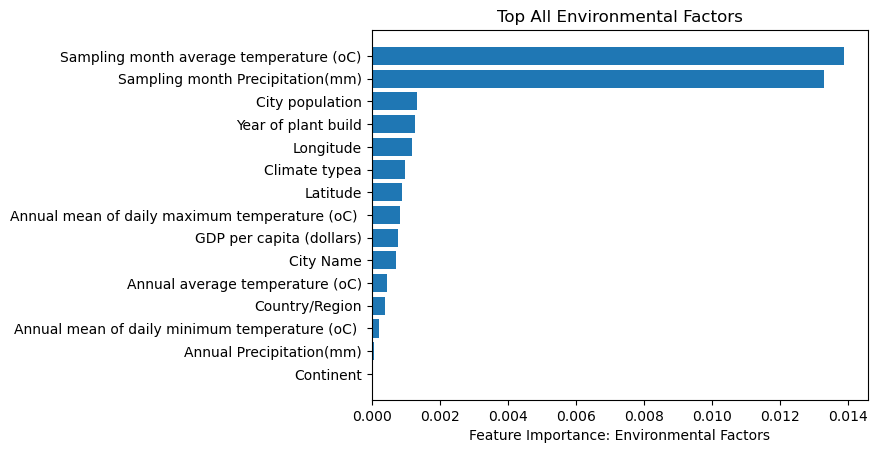

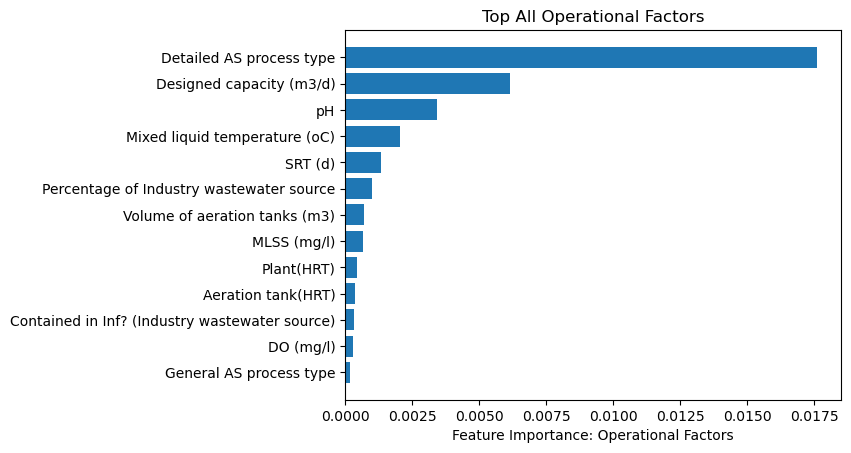

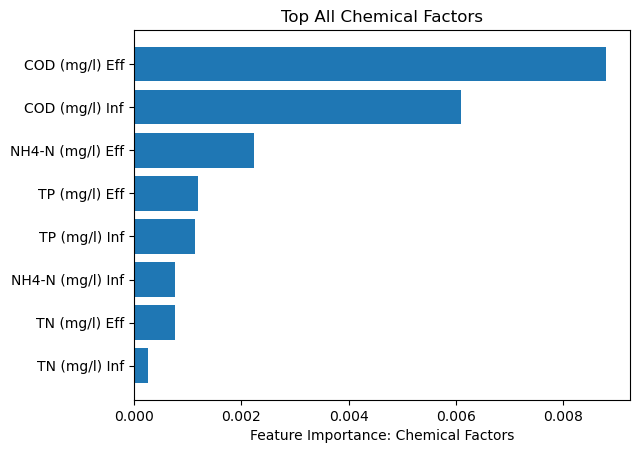

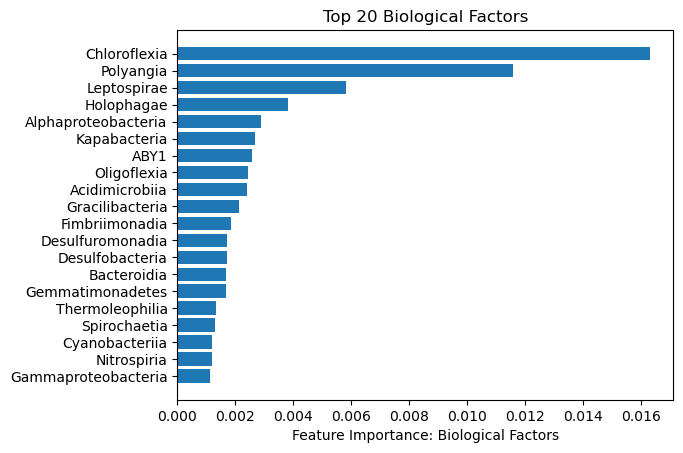

In [27]:
factor_types = ['Environmental', 'Operational', 'Chemical', 'Biological']
factor_keywords = [environmental_keywords, operational_keywords, chemical_keywords, biological_keywords]

# Define the number of features to show for biological factors
num_features_to_show = 20

# Iterate through each factor type and plot the corresponding feature importance
for factor_type, keywords in zip(factor_types, factor_keywords):
    indices = [np.where(features_bodp.columns[sorted_idx] == col)[0][0] for col in keywords]
    indices = np.sort(indices)

    perm_sorted = perm_importance_mean[indices]
    perm_sorted = np.sort(perm_sorted)

    features_columns = features_bodp.columns[sorted_idx]

    if factor_type == 'Biological':
        plt.barh(
            features_columns[indices][-num_features_to_show:], perm_sorted[-num_features_to_show:]
        )
    else:
        plt.barh(
            features_columns[indices], perm_sorted
        )

    plt.xlabel(f"Feature Importance: {factor_type} Factors")
    plt.title(f"Top {num_features_to_show if factor_type == 'Biological' else 'All'} {factor_type} Factors")
    plt.show()

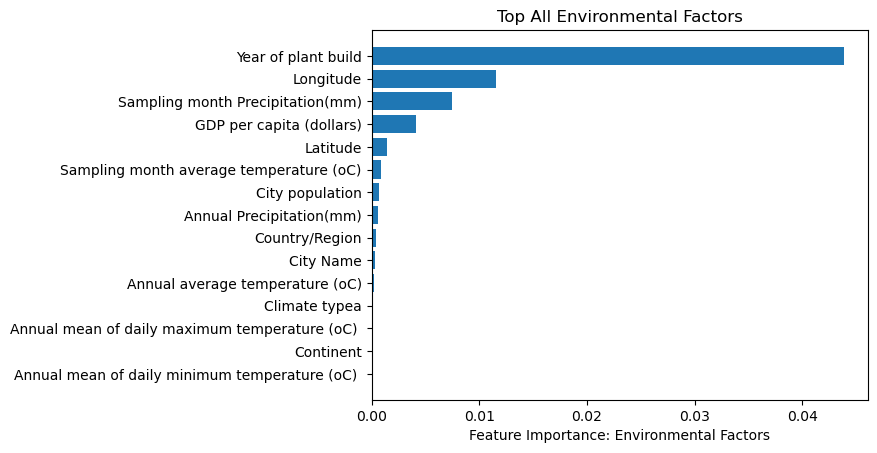

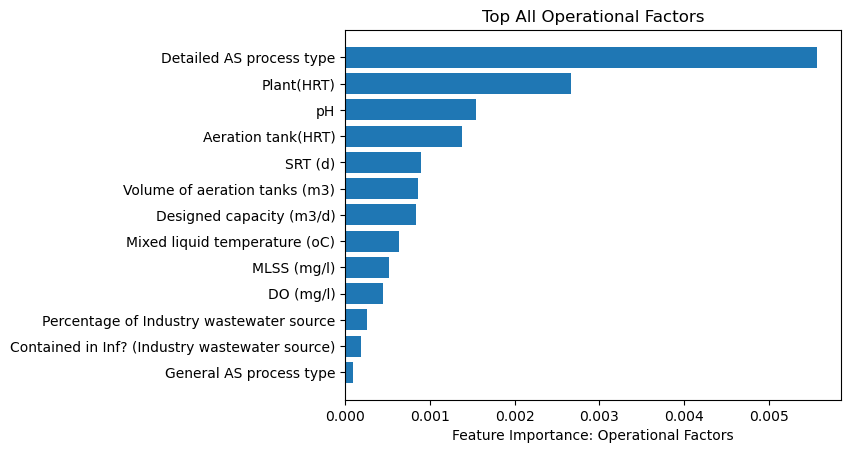

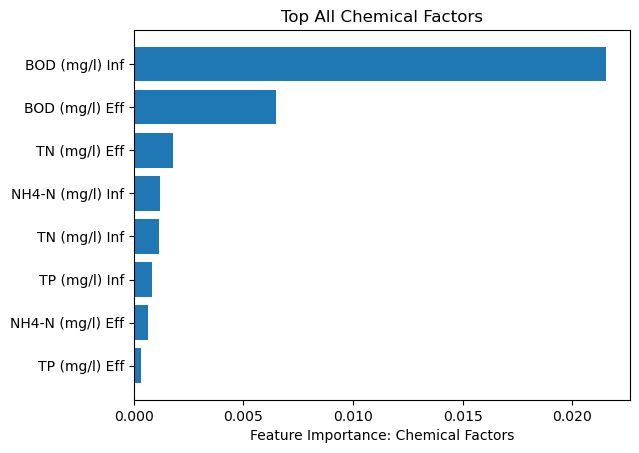

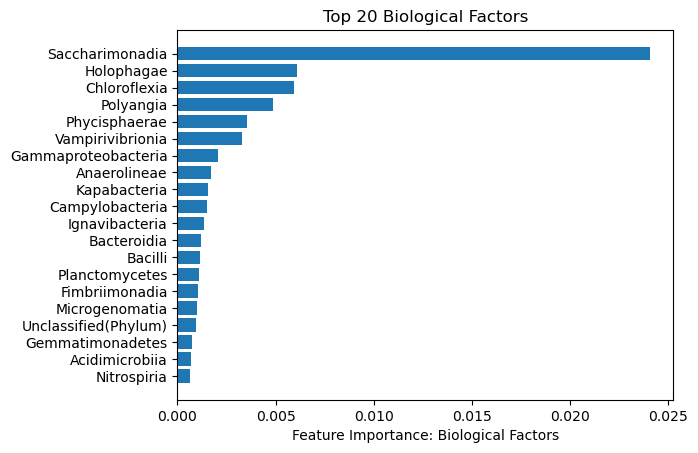

In [28]:
cate = [environmental_keywords,operational_keywords,chemical_keywords_1,biological_keywords]

perm_importance_mean, sorted_idx = regressor7.cate_features(True)

# Define the factor types and corresponding keywords
factor_types = ['Environmental', 'Operational', 'Chemical', 'Biological']
factor_keywords = [environmental_keywords, operational_keywords, chemical_keywords_1, biological_keywords]

# Define the number of features to show for biological factors
num_features_to_show = 20

# Iterate through each factor type and plot the corresponding feature importance
for factor_type, keywords in zip(factor_types, factor_keywords):
    indices = [np.where(features_codp.columns[sorted_idx] == col)[0][0] for col in keywords]
    indices = np.sort(indices)

    perm_sorted = perm_importance_mean[indices]
    perm_sorted = np.sort(perm_sorted)

    features_columns = features_codp.columns[sorted_idx]

    if factor_type == 'Biological':
        plt.barh(
            features_columns[indices][-num_features_to_show:], perm_sorted[-num_features_to_show:]
        )
    else:
        plt.barh(
            features_columns[indices], perm_sorted
        )

    plt.xlabel(f"Feature Importance: {factor_type} Factors")
    plt.title(f"Top {num_features_to_show if factor_type == 'Biological' else 'All'} {factor_type} Factors")
    plt.show()

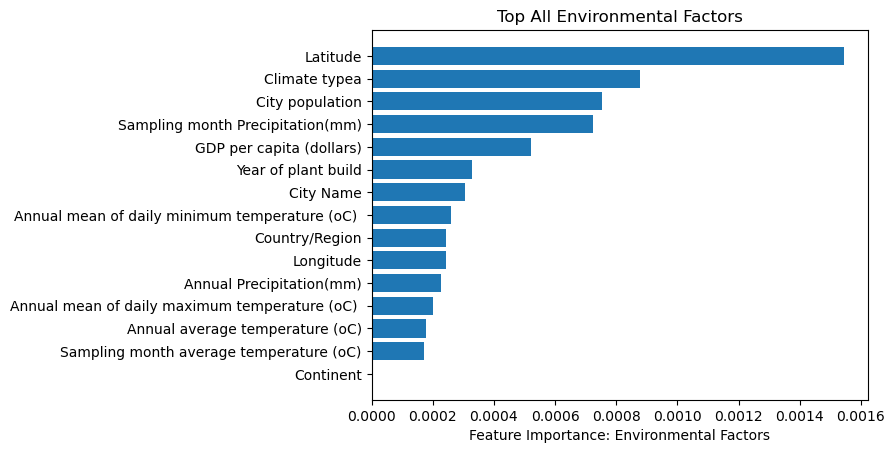

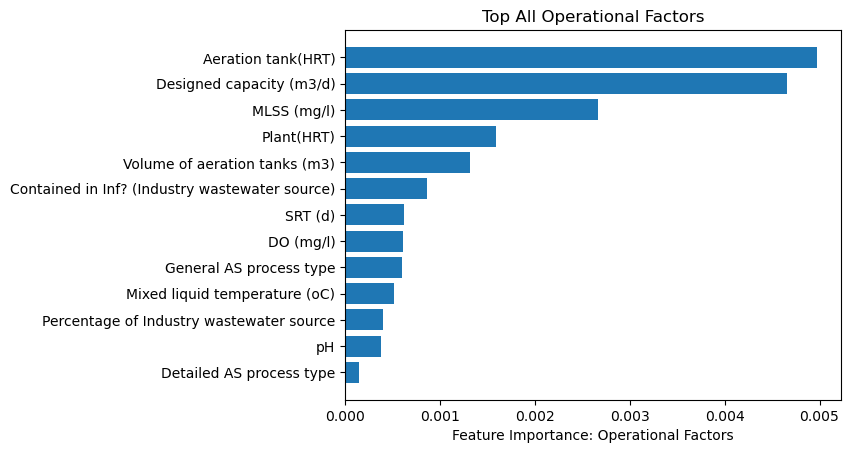

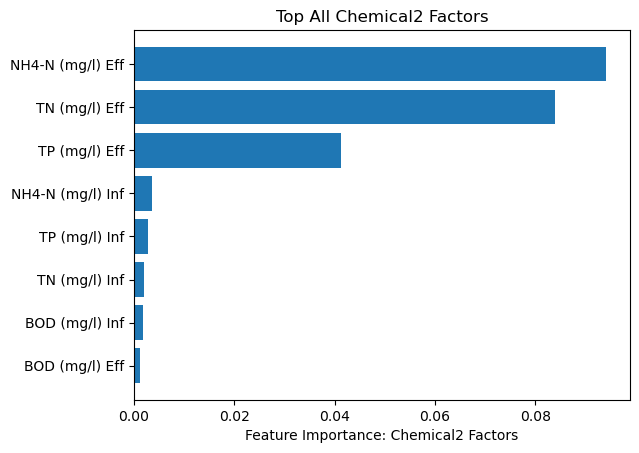

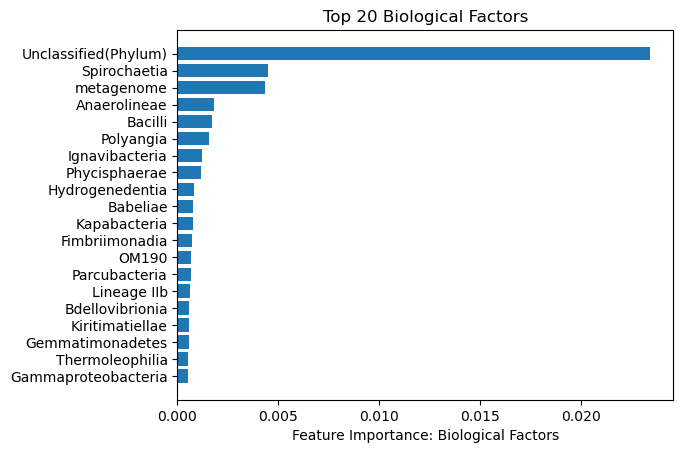

In [29]:
cate = [environmental_keywords,operational_keywords,chemical_keywords_2,biological_keywords]

perm_importance_mean, sorted_idx = regressor8.cate_features(True)

# Define the factor types and corresponding keywords
factor_types = ['Environmental', 'Operational', 'Chemical2', 'Biological']
factor_keywords = [environmental_keywords, operational_keywords, chemical_keywords_2, biological_keywords]

# Define the number of features to show for biological factors
num_features_to_show = 20

# Iterate through each factor type and plot the corresponding feature importance
for factor_type, keywords in zip(factor_types, factor_keywords):
    indices = [np.where(features_nh4np.columns[sorted_idx] == col)[0][0] for col in keywords]
    indices = np.sort(indices)

    perm_sorted = perm_importance_mean[indices]
    perm_sorted = np.sort(perm_sorted)

    features_columns = features_codp.columns[sorted_idx]

    if factor_type == 'Biological':
        plt.barh(
            features_columns[indices][-num_features_to_show:], perm_sorted[-num_features_to_show:]
        )
    else:
        plt.barh(
            features_columns[indices], perm_sorted
        )

    plt.xlabel(f"Feature Importance: {factor_type} Factors")
    plt.title(f"Top {num_features_to_show if factor_type == 'Biological' else 'All'} {factor_type} Factors")
    plt.show()

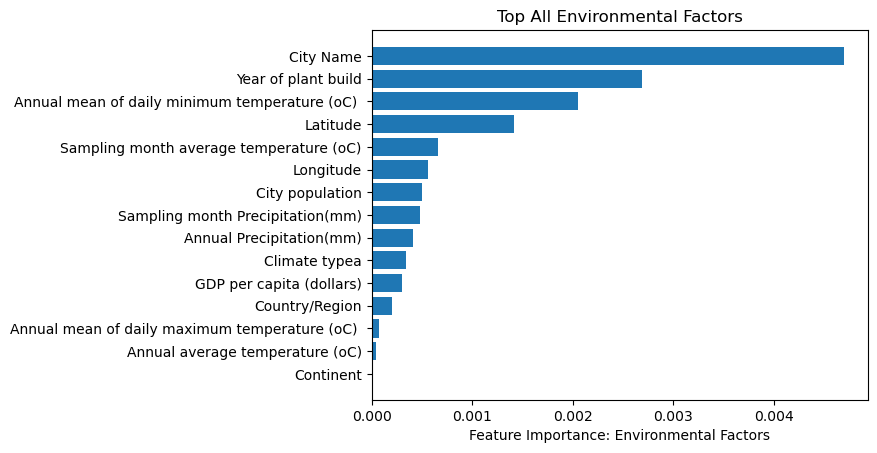

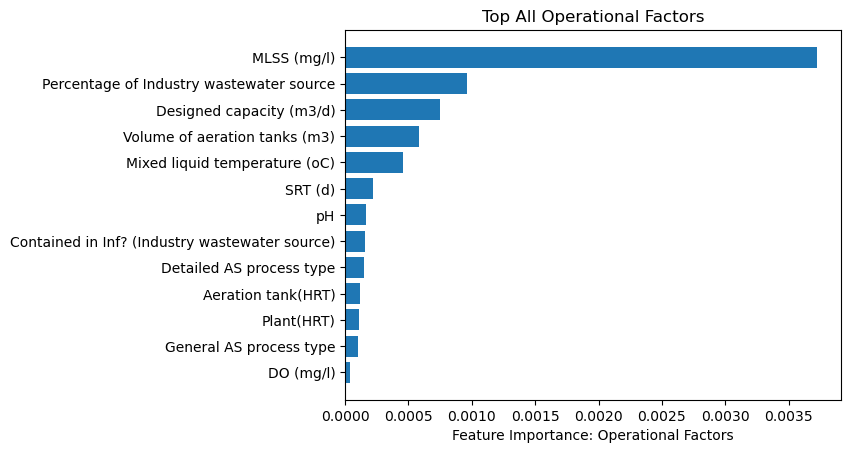

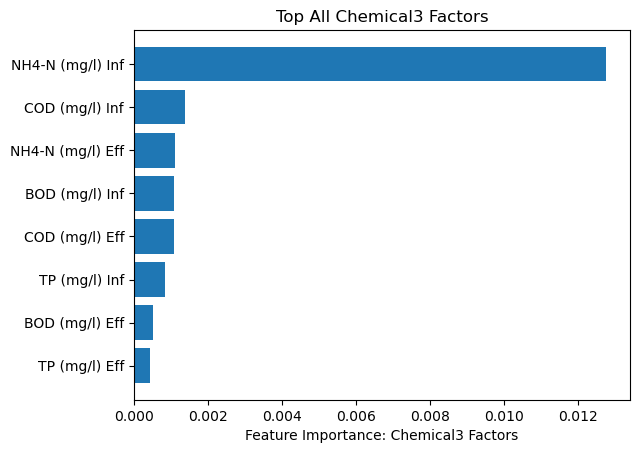

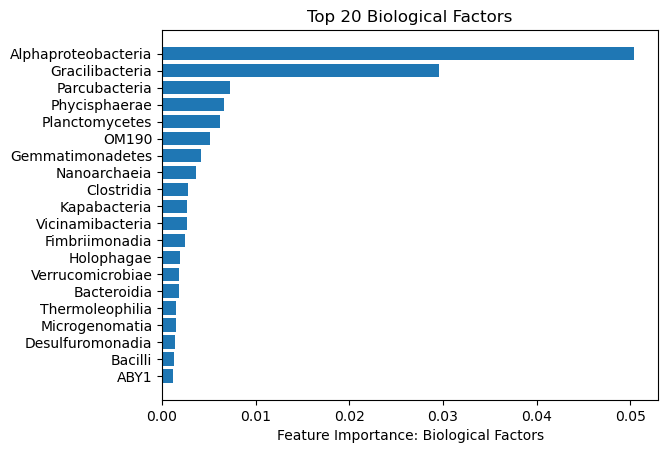

In [30]:
cate = [environmental_keywords,operational_keywords,chemical_keywords_3,biological_keywords]

perm_importance_mean, sorted_idx = regressor9.cate_features(True)

# Define the factor types and corresponding keywords
factor_types = ['Environmental', 'Operational', 'Chemical3', 'Biological']
factor_keywords = [environmental_keywords, operational_keywords, chemical_keywords_3, biological_keywords]

# Define the number of features to show for biological factors
num_features_to_show = 20

# Iterate through each factor type and plot the corresponding feature importance
for factor_type, keywords in zip(factor_types, factor_keywords):
    indices = [np.where(features_tnp.columns[sorted_idx] == col)[0][0] for col in keywords]
    indices = np.sort(indices)

    perm_sorted = perm_importance_mean[indices]
    perm_sorted = np.sort(perm_sorted)

    features_columns = features_tnp.columns[sorted_idx]

    if factor_type == 'Biological':
        plt.barh(
            features_columns[indices][-num_features_to_show:], perm_sorted[-num_features_to_show:]
        )
    else:
        plt.barh(
            features_columns[indices], perm_sorted
        )

    plt.xlabel(f"Feature Importance: {factor_type} Factors")
    plt.title(f"Top {num_features_to_show if factor_type == 'Biological' else 'All'} {factor_type} Factors")
    plt.show()

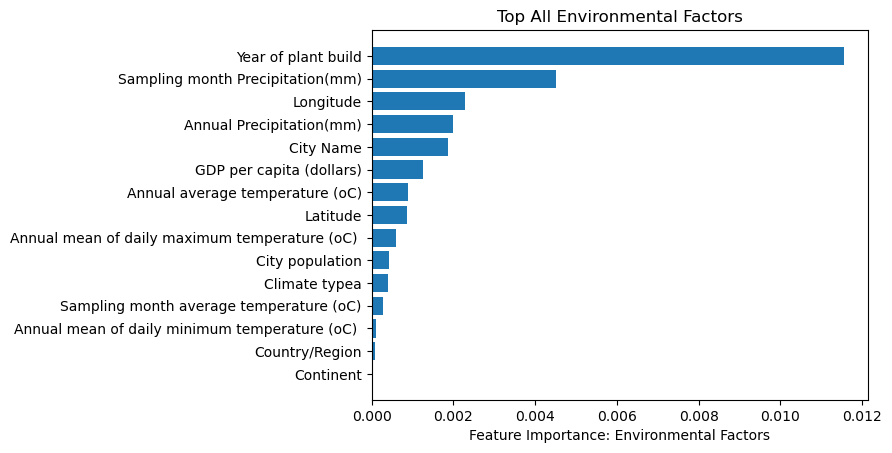

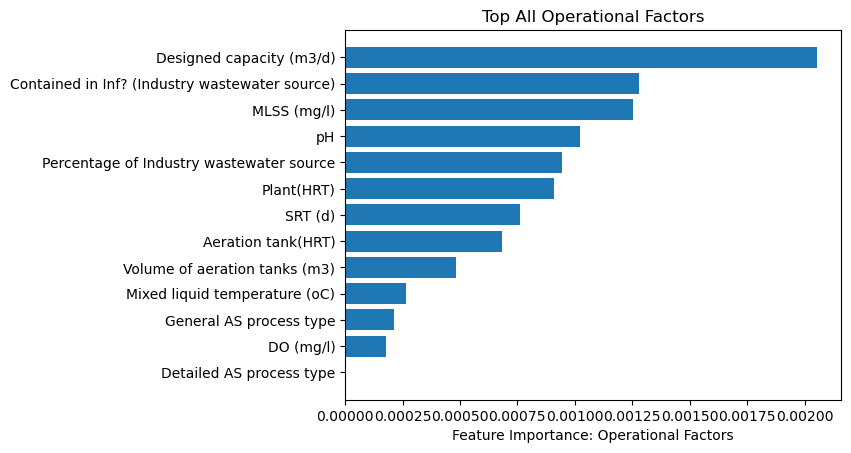

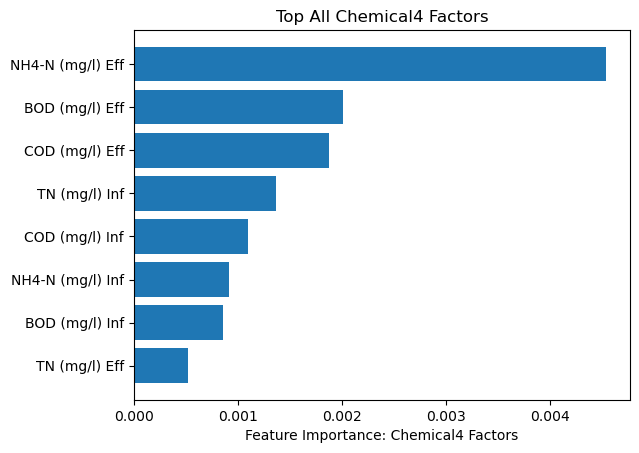

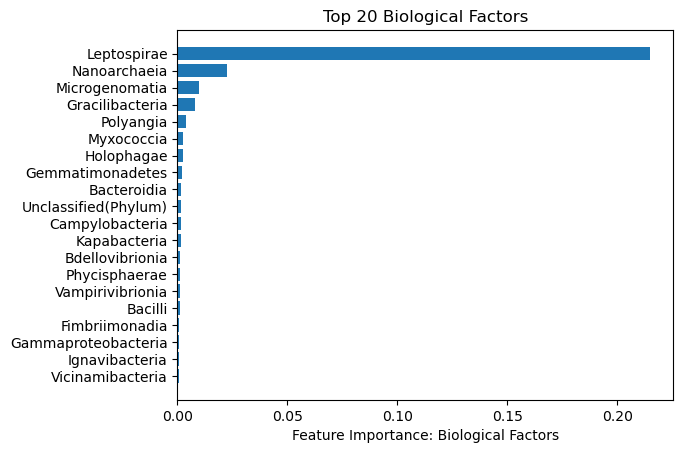

In [31]:
cate = [environmental_keywords,operational_keywords,chemical_keywords_4,biological_keywords]

perm_importance_mean, sorted_idx = regressor10.cate_features(True)

# Define the factor types and corresponding keywords
factor_types = ['Environmental', 'Operational', 'Chemical4', 'Biological']
factor_keywords = [environmental_keywords, operational_keywords, chemical_keywords_4, biological_keywords]

# Define the number of features to show for biological factors
num_features_to_show = 20

# Iterate through each factor type and plot the corresponding feature importance
for factor_type, keywords in zip(factor_types, factor_keywords):
    indices = [np.where(features_tpp.columns[sorted_idx] == col)[0][0] for col in keywords]
    indices = np.sort(indices)

    perm_sorted = perm_importance_mean[indices]
    perm_sorted = np.sort(perm_sorted)

    features_columns = features_tpp.columns[sorted_idx]

    if factor_type == 'Biological':
        plt.barh(
            features_columns[indices][-num_features_to_show:], perm_sorted[-num_features_to_show:]
        )
    else:
        plt.barh(
            features_columns[indices], perm_sorted
        )

    plt.xlabel(f"Feature Importance: {factor_type} Factors")
    plt.title(f"Top {num_features_to_show if factor_type == 'Biological' else 'All'} {factor_type} Factors")
    plt.show()

In [32]:
regressor6.regressor = regressor6.best_regressor.model
regressor6.original_predictor = 'rfr'

regressor7.regressor = regressor7.best_regressor.model
regressor7.original_predictor = 'rfr'

regressor8.regressor = regressor8.best_regressor.model
regressor8.original_predictor = 'rfr'

regressor9.regressor = regressor9.best_regressor.model
regressor9.original_predictor = 'rfr'

regressor10.regressor = regressor10.best_regressor.model
regressor10.original_predictor = 'rfr'

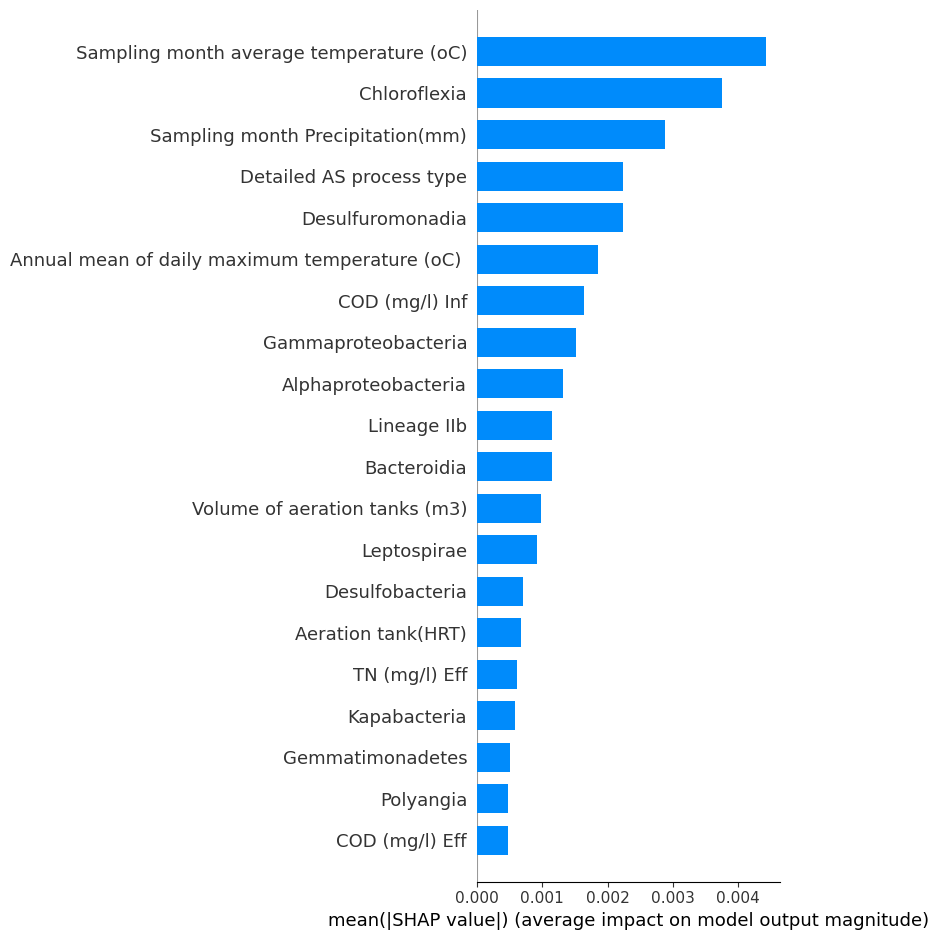

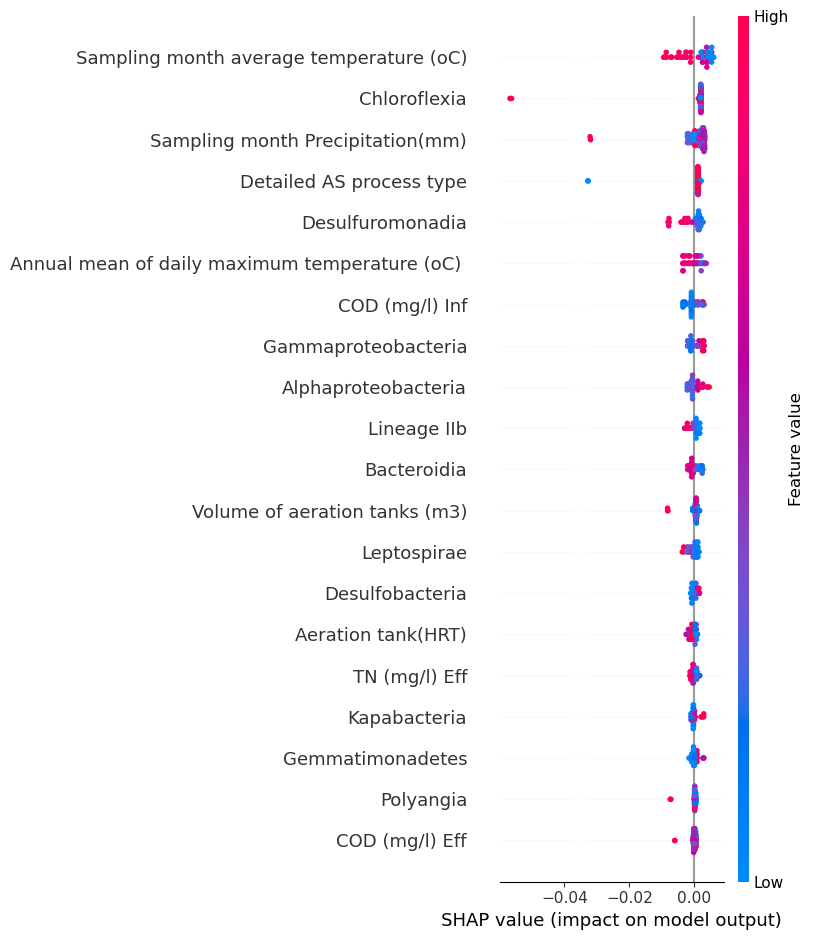

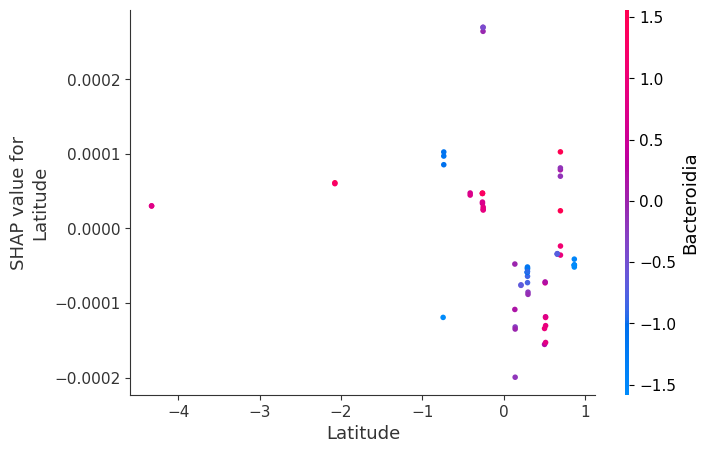

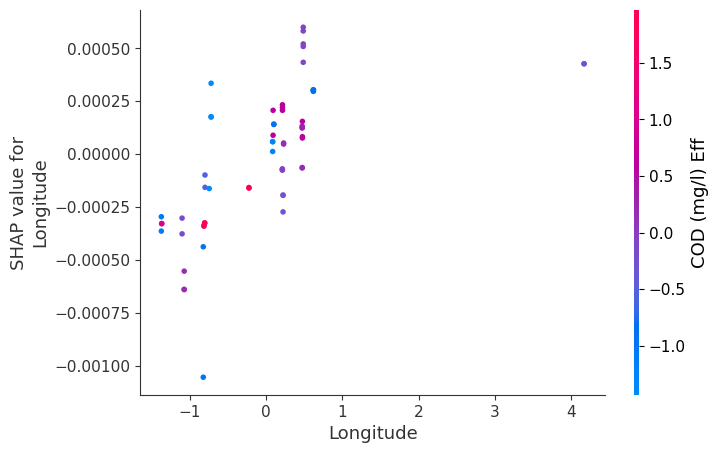

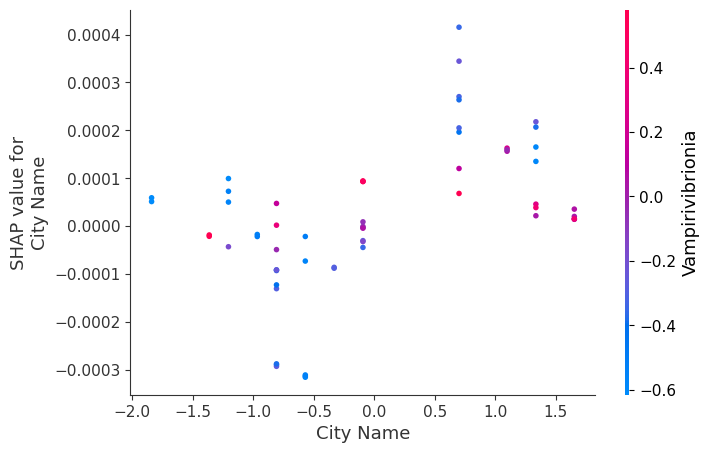

...

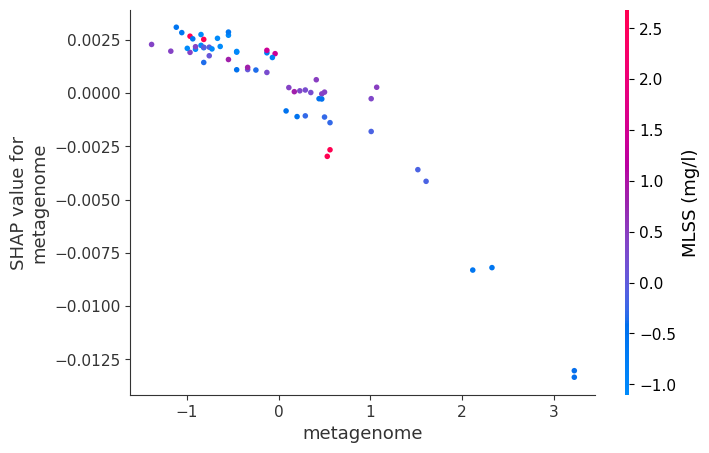

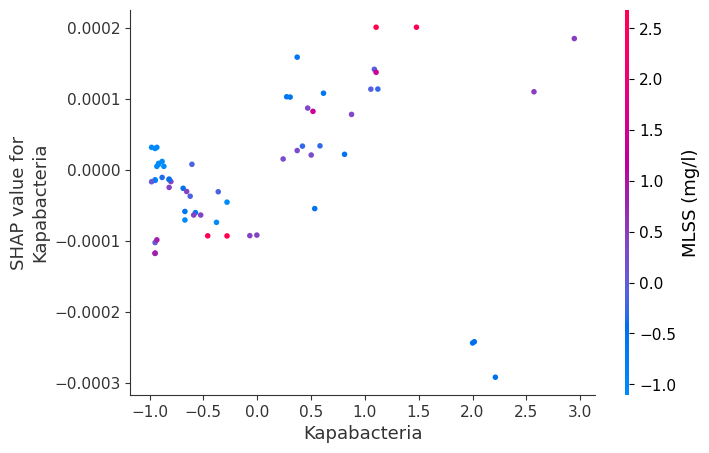

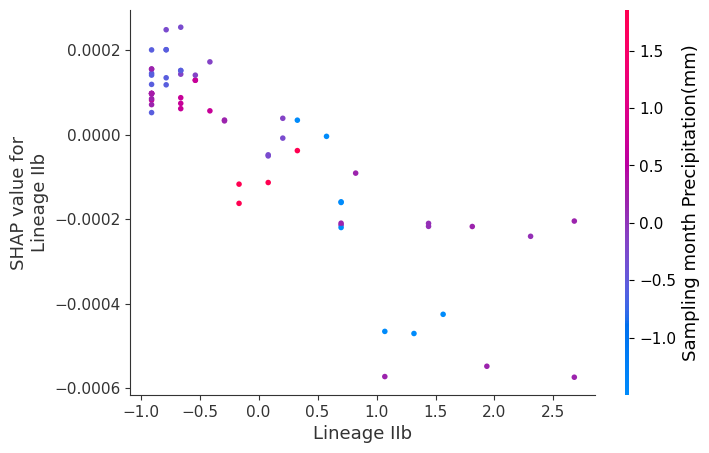

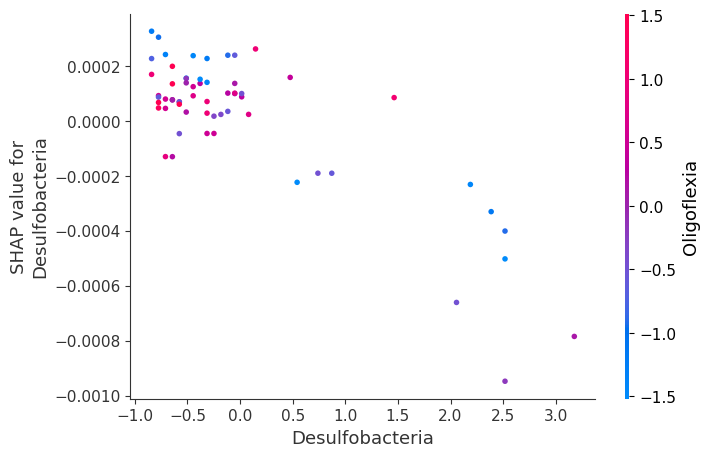

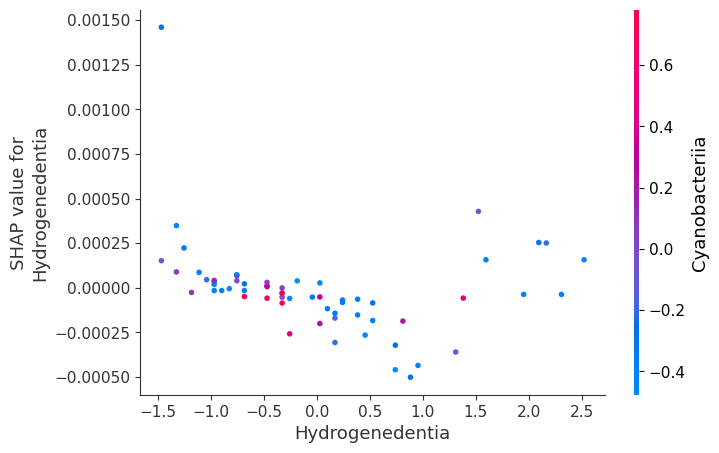

InvalidModelError: Model type not yet supported by TreeExplainer: <class 'sklearn.linear_model._bayes.BayesianRidge'>

In [33]:
regressor6.imp_features(extensive = True)

In [ ]:
regressor7.imp_features(extensive = True)


In [ ]:
regressor8.imp_features(extensive = True)

In [ ]:
regressor9.imp_features(extensive = True)

In [ ]:
regressor10.imp_features(extensive = True)